In [3]:
import matplotlib.pyplot as plt
from skimage.feature import hog
from skimage import data, exposure
import cv2 as cv
from scipy.spatial import distance
import os

In [4]:
pixel_size = (12, 12)

In [5]:
def DrawHog(path, size, show):
    image = cv.imread(path)
    fd, hog_image = hog(image, orientations=8, pixels_per_cell= size,
                        cells_per_block=(1, 1), visualize=True, channel_axis=-1)
    if(show):
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)
        
        ax1.axis('off')
        ax1.imshow(cv.cvtColor(image, cv.COLOR_BGR2RGB), cmap=plt.cm.gray)
        ax1.set_title('Input image')
        
        hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))
        
        ax2.axis('off')
        ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
        ax2.set_title('Histogram of Oriented Gradients')
        plt.show()
    return fd

def DrawHogImg(img, size):
    img = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
    fd, hog_image = hog(img, orientations=8, pixels_per_cell= size,
                        cells_per_block=(1, 1), visualize=True)

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(8, 4), sharex=True, sharey=True)

    ax1.axis('off')
    ax1.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB), cmap=plt.cm.gray)
    ax1.set_title('Input image')

    # Rescale histogram for better display
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

    ax2.axis('off')
    ax2.imshow(hog_image_rescaled, cmap=plt.cm.gray)
    ax2.set_title('Histogram of Oriented Gradients')
    plt.show()
    return fd

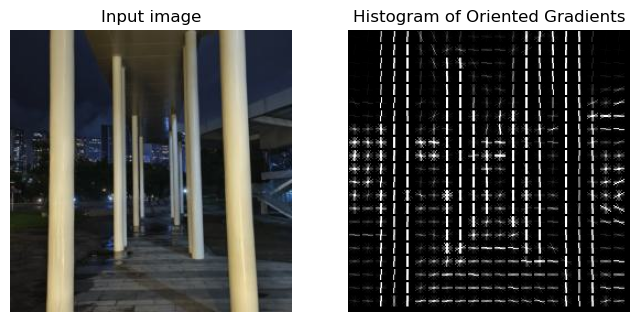

In [6]:
target = DrawHog("./dataset/img_256/19.jpg", pixel_size, True)

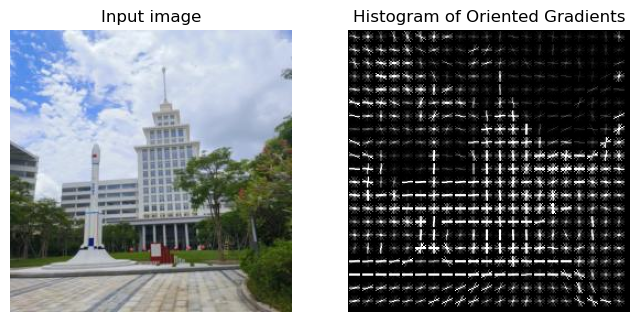

16.268632757472982
1.0192709104854498


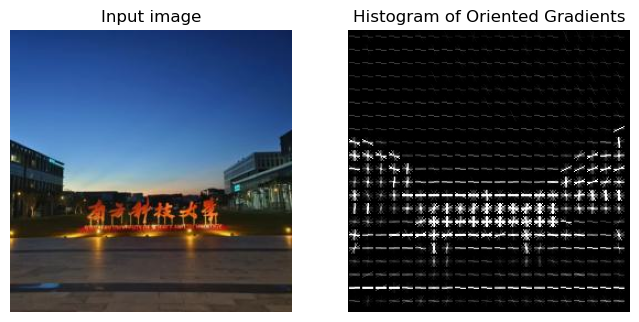

19.916599635378848
1.0838212431212546


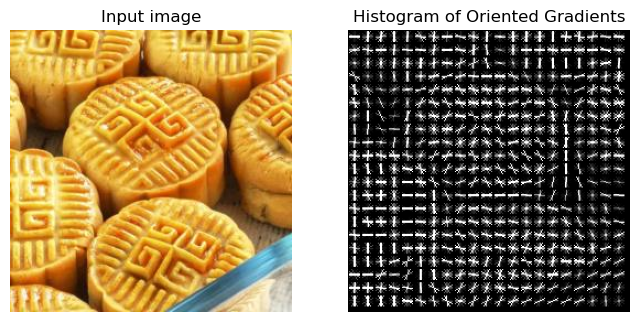

17.310594196660396
1.0335213324486712


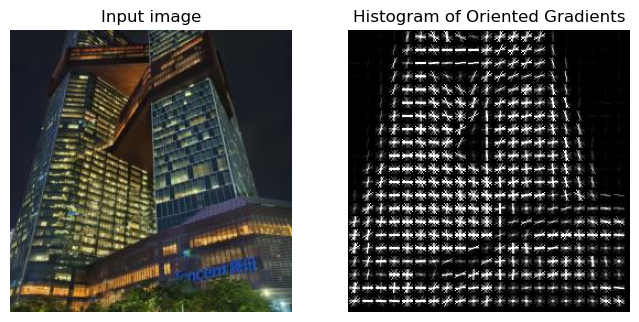

15.876163124845855
0.9022769448080099


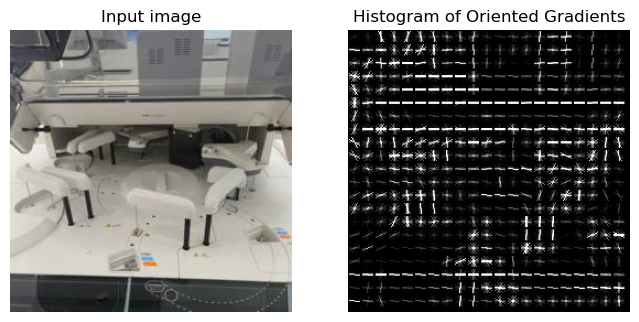

17.959502954184362
1.037786045461064


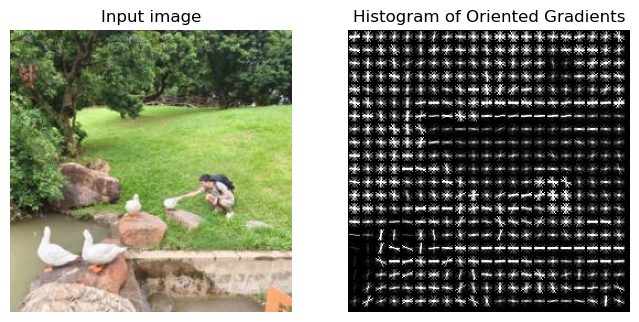

15.856615000894326
1.1017123169075989


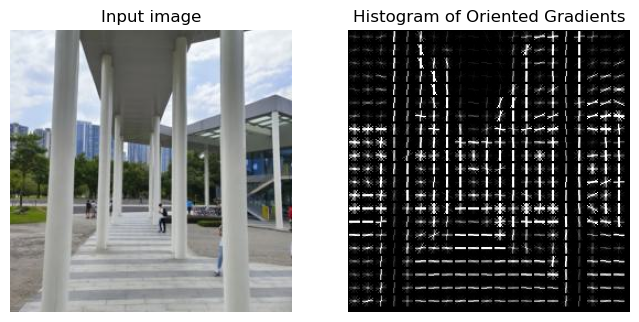

12.75164525450728
0.4849687961772826


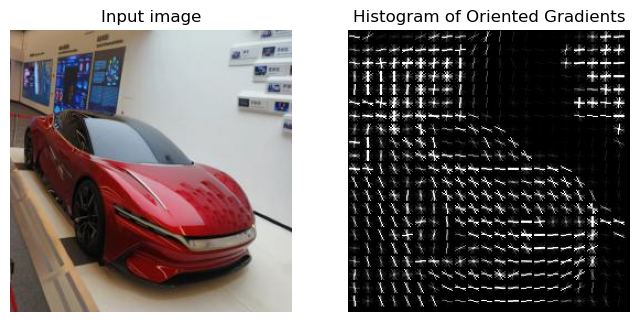

17.771898859853348
0.9446890223522628


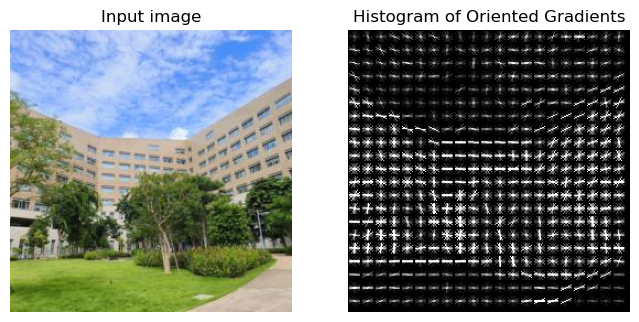

16.291207036432333
1.1055173360662673


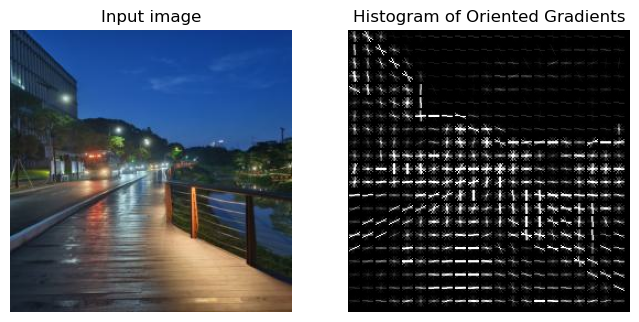

17.338380435261737
0.9968177535156686


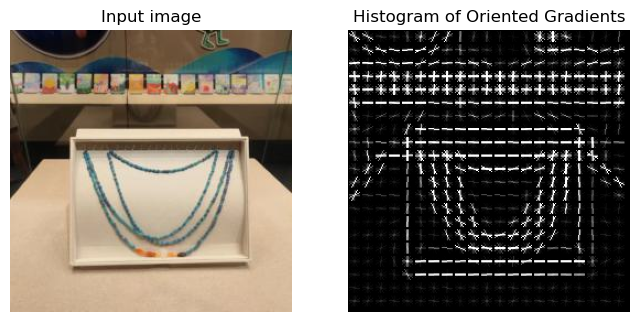

17.57076770085058
0.9569521424731074


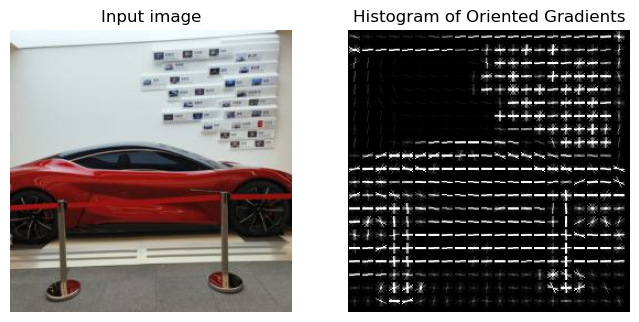

19.406291702875908
1.0421127401870924


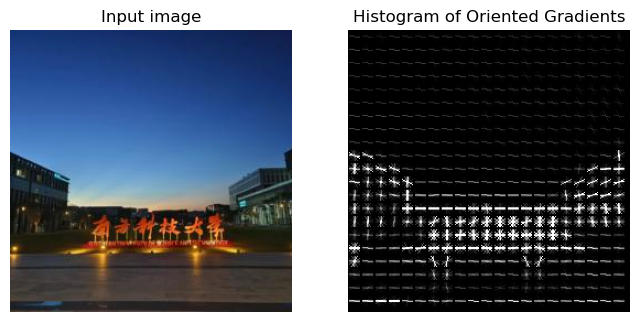

20.090559445882597
1.0871688736560132


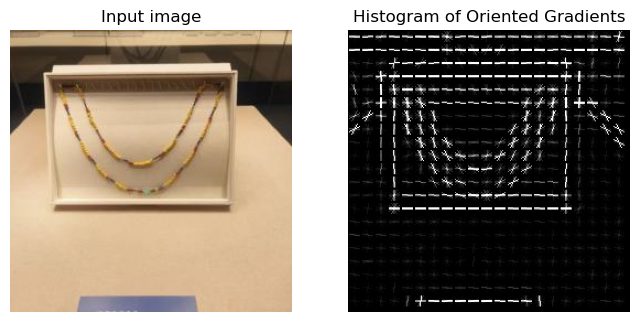

18.13159596269411
0.9857666783420632


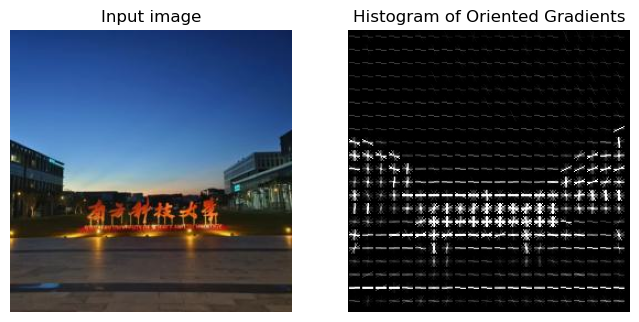

19.916599635378848
1.0838212431212546


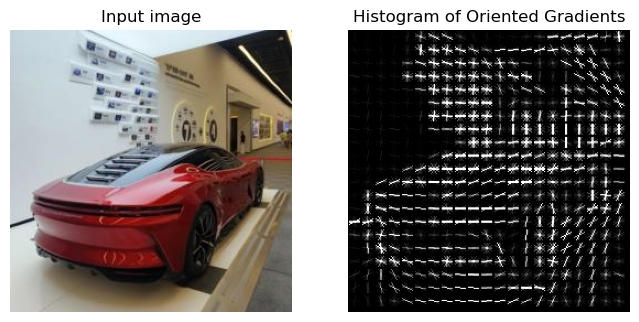

17.98555594541106
0.9947876257140554


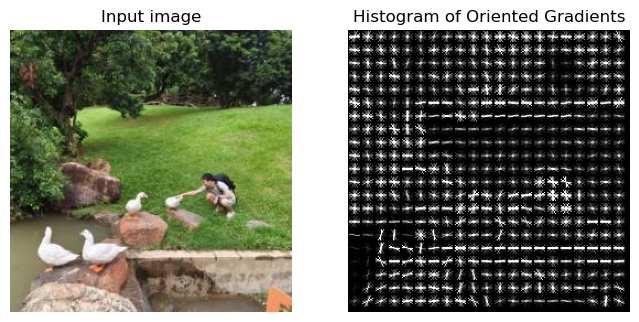

15.89274007741722
1.0986806242312532


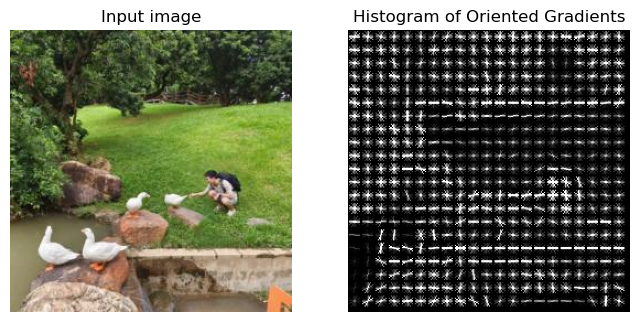

15.90407215849774
1.1141119013199619


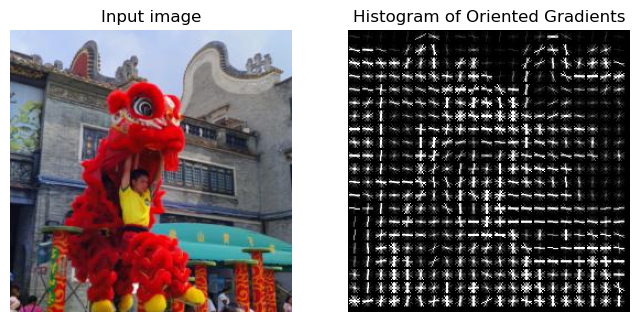

16.170355253062482
0.9911177781160856


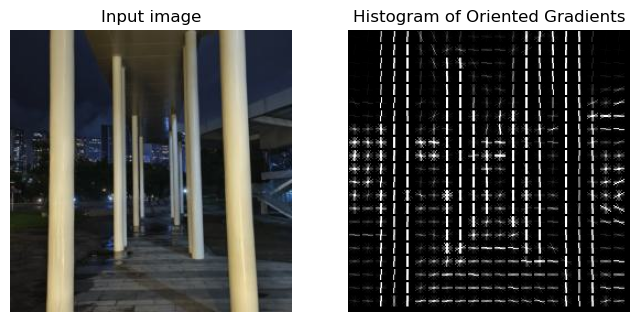

0.0
0.0


In [7]:
filenames = os.listdir("./dataset/img_256")
for file in filenames:
    test = DrawHog("./dataset/img_256/" + file, pixel_size, True)
    print(distance.euclidean(target, test))
    print(distance.correlation(target,test))

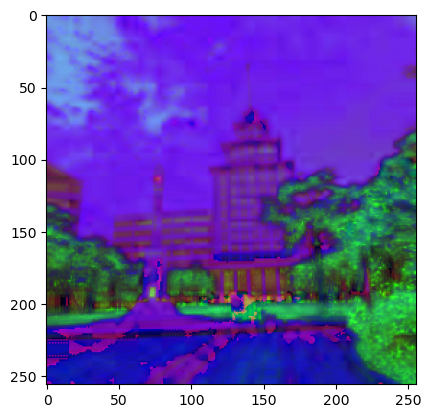

263.87769477787987


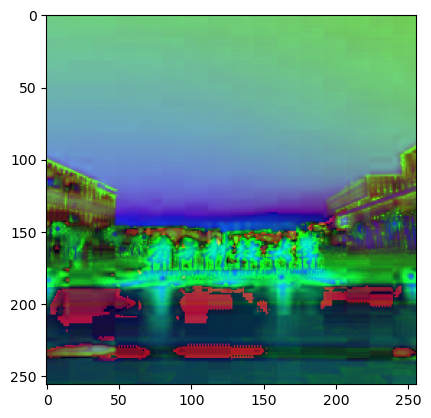

283.365545188773


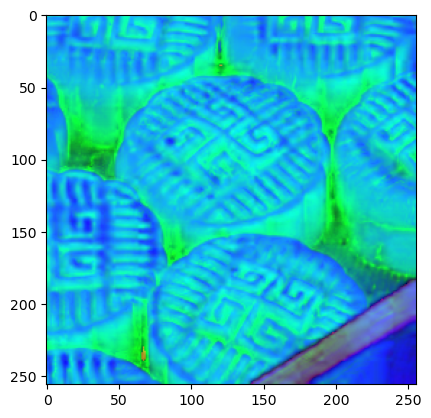

973.125265598336


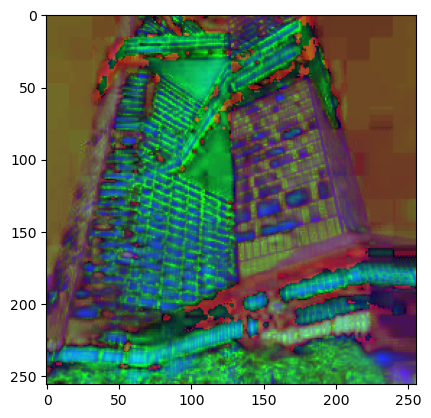

998.5156514995274


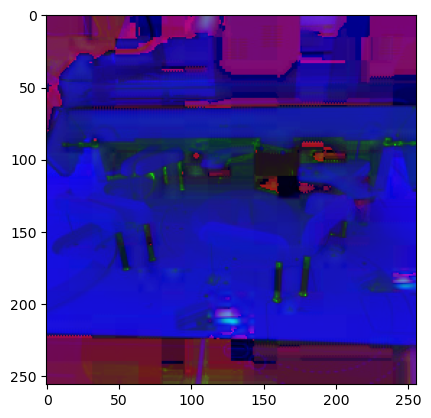

1359.4664017097782


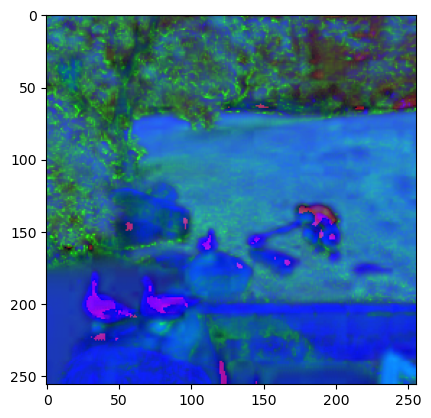

72.80466115183819


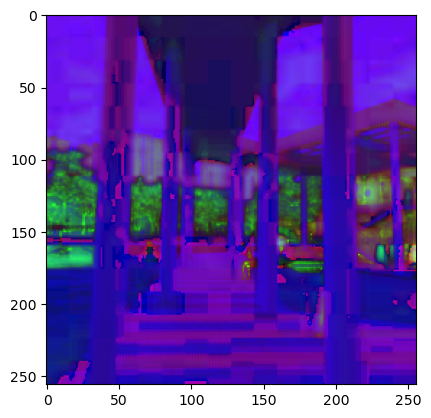

370.50159248880254


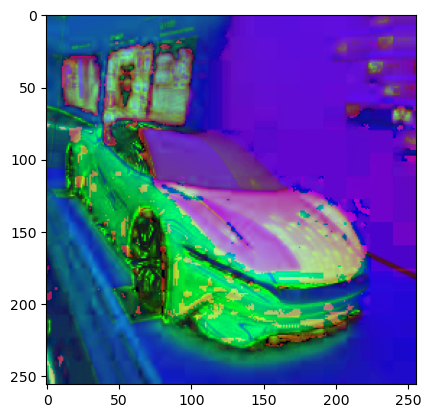

4999.9940771284155


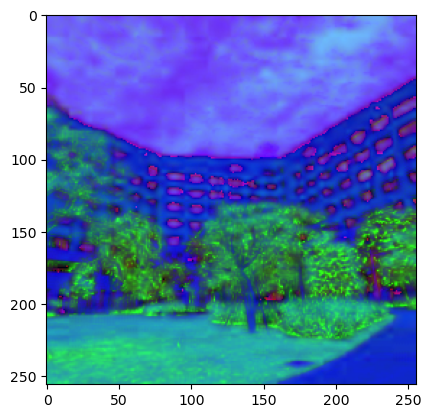

53.64572985881751


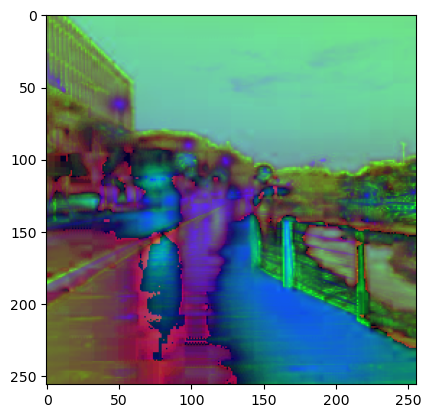

206.87945785724295


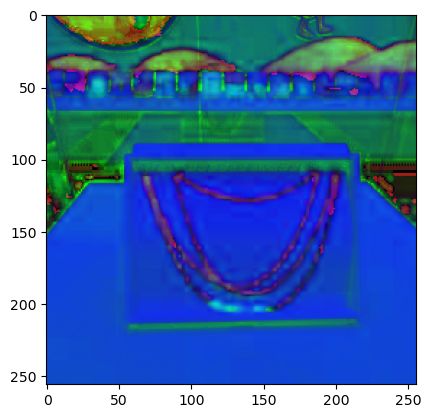

12.948819783000097


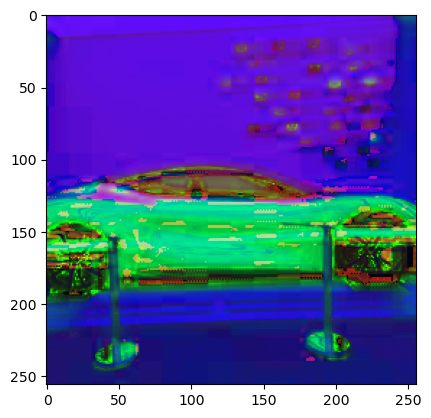

733.8280508284085


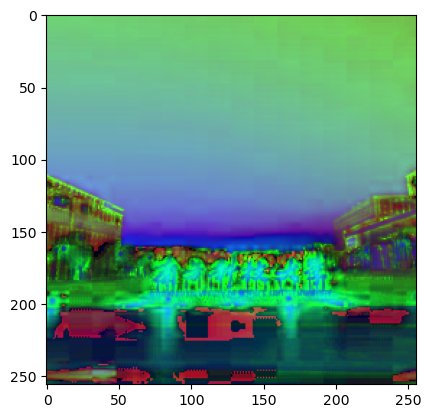

172.41025785186207


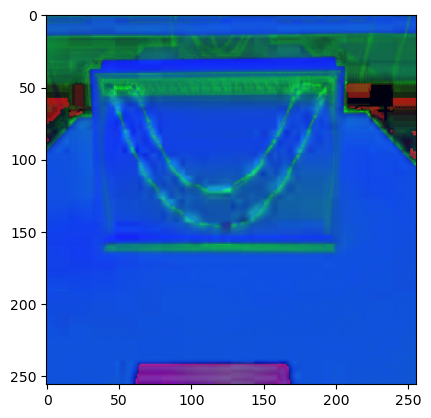

0.0


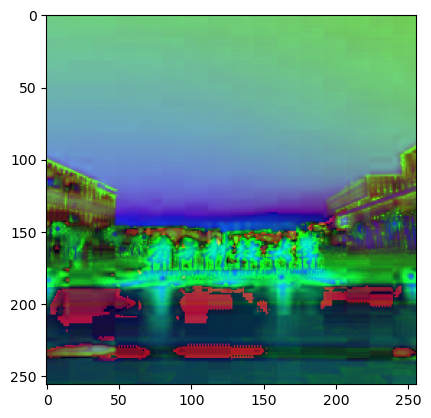

283.365545188773


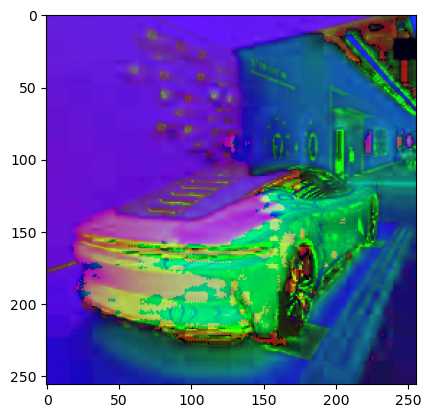

6052.958671103846


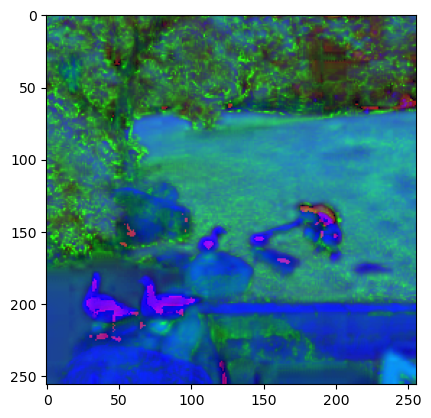

110.69783286648298


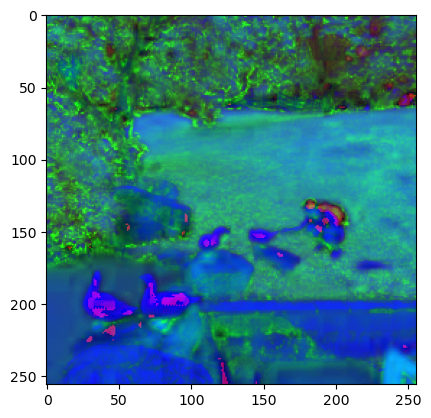

60.42800144264571


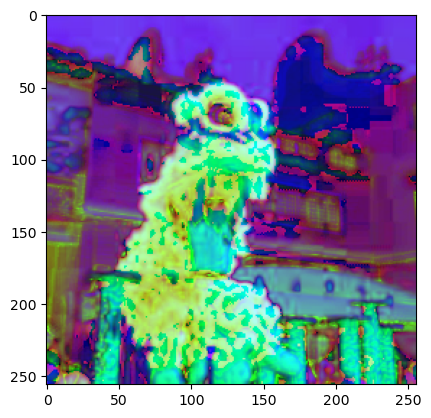

506.29907542902004


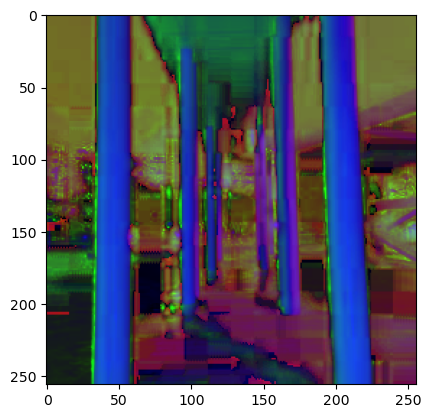

507.96889248222806


In [16]:
target = cv.imread("./dataset/img_256/10.jpg")
target = cv.cvtColor(target, cv.COLOR_BGR2HSV)
target_hist = cv.calcHist([target], [0, 1, 2], None, [8, 8, 8],
                          [0, 256, 0, 256, 0, 256])
target_hist = cv.normalize(target_hist, target_hist)

for test_file in filenames:
    test_img = cv.imread("./dataset/img_256/" + test_file)
    test_img = cv.cvtColor(test_img, cv.COLOR_BGR2HSV)
    test_hist = cv.calcHist([test_img], [0, 1, 2], None, [8, 8, 8],
                            [0, 256, 0, 256, 0, 256])
    test_hist = cv.normalize(test_hist, test_hist)
    chi = cv.compareHist(target_hist, test_hist, cv.HISTCMP_CHISQR)
    
    plt.imshow(test_img)
    plt.show()
    
    print(chi)

In [17]:
for target_file in filenames:
    target_img = cv.imread("./dataset/img_256/" + target_file)
    target_img = cv.cvtColor(target_img, cv.COLOR_BGR2HSV)
    target = DrawHog("./dataset/img_256/" + target_file, pixel_size, False)
    
    for test_file in filenames:
        test_img = cv.imread("./dataset/img_256/" + test_file)
        test_img = cv.cvtColor(test_img, cv.COLOR_BGR2HSV)
        
        # Structural Similarity
        test = DrawHog("./dataset/img_256/" + test_file, pixel_size, False)
        corr = distance.correlation(target,test)
        if(0.3 < corr < 0.5):
            print("Hog Score")
            print(corr)
            print("These images are similar")
            print(target_file)
            print(test_file)
            print("=====================================")
        elif (corr < 0.3):
            if(target_file != test_file):
                print("Hog Score")
                print(corr)
                print("These images are same")
                print(target_file)
                print(test_file)
                print("=====================================")
                
        # Color Similarity
        target_hist = cv.calcHist([target_img], [0, 1, 2], None, [8, 8, 8],
                                  [0, 256, 0, 256, 0, 256])
        target_hist = cv.normalize(target_hist, target_hist)
        test_hist = cv.calcHist([test_img], [0, 1, 2], None, [8, 8, 8],
                                [0, 256, 0, 256, 0, 256])
        test_hist = cv.normalize(test_hist, test_hist)
        chi = cv.compareHist(target_hist, test_hist, cv.HISTCMP_CHISQR)
        if(5 < chi < 30 and target_file != test_file):
            print("Chi-squared distance")
            print(chi)
            print("These images are similar")
            print(target_file)
            print(test_file)
            print("=====================================")

Chi-squared distance
8.109147371789419
These images are similar
14.jpg
01.jpg
Chi-squared distance
24.137088415671883
These images are similar
14.jpg
16.jpg
Chi-squared distance
7.679550910679808
These images are similar
14.jpg
10.jpg
Hog Score
0.2986322016576456
These images are same
15.jpg
11.jpg
Hog Score
0.0
These images are same
15.jpg
04.jpg
Chi-squared distance
28.075732853104814
These images are similar
02.jpg
06.jpg
Chi-squared distance
19.767302254044917
These images are similar
02.jpg
13.jpg
Chi-squared distance
25.929187925715574
These images are similar
02.jpg
10.jpg
Hog Score
0.2025126703406781
These images are same
02.jpg
08.jpg
Chi-squared distance
11.652130175671555
These images are similar
02.jpg
08.jpg
Hog Score
0.28013084993724846
These images are same
02.jpg
20.jpg
Chi-squared distance
13.346748591418717
These images are similar
02.jpg
20.jpg
Chi-squared distance
18.995890507642592
These images are similar
16.jpg
14.jpg
Hog Score
0.4849687961772826
These images are